# Regression Model Analysis of FDA Subset Data

* The Pycaret package will be utilized to first determine the best performing model on the data using the compare_models function.
* Then the model's model hyperparameters will be tuned using the tune_model function which uses cross-validation to test different combinations of hyperparameters.
* Followed by testing both bagging and boosting ensembles with the model.
* After the model with the maximum performance based on (R^2, RMSE, and MAPE) is chosen it will be finalized and saved.

In [1]:
import numpy as np
import pandas as pd
from sklearn import datasets, metrics
from pycaret.datasets import get_data
from pycaret.regression import *
import warnings
warnings.filterwarnings("ignore")

In [2]:
# set up PyCaret
data = pd.read_csv('D:/DataSets/FDA_1615.csv')
exclude_columns = ['zinc_id', 'smiles', 'Molecule Name', 'ROMol', 'Fingerprint', 'number']
target_column = 'similarity_mean'

# Create a new dataframe with the columns of interest
X = data.drop(exclude_columns + [target_column], axis=1)
y = data[target_column]
data = pd.concat([X, y], axis=1)

reg_model = setup(data, target=target_column, numeric_imputation="drop", categorical_imputation="pass", preprocess=False, use_gpu=True, train_size=0.8)

# Compare models using Pycaret
best_model = compare_models()

# Fine-tune the best model using Pycaret (RandomGridSearch, sklearn)
tuned_sk = tune_model(best_model, choose_better = True)

# tune model optuna
tuned_opt = tune_model(best_model, search_library = 'optuna', choose_better = True)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2080, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

,Description,Value
0,Session id,158
1,Target,similarity_mean
2,Target type,Regression
3,Original data shape,"(1615, 1616)"
4,Transformed data shape,"(1615, 1616)"
5,Transformed train set shape,"(1292, 1616)"
6,Transformed test set shape,"(323, 1616)"
7,Numeric features,1615


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2080, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more 

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.0032,0.0000,0.0044,0.9515,0.0041,0.0373,3.8900
catboost,CatBoost Regressor,0.0033,0.0000,0.0045,0.9509,0.0041,0.0387,12.3030
huber,Huber Regressor,0.0029,0.0000,0.0046,0.9481,0.0042,0.0377,4.4040
xgboost,Extreme Gradient Boosting,0.0032,0.0000,0.0048,0.9427,0.0044,0.0377,4.3310
ridge,Ridge Regression,0.0031,0.0000,0.0049,0.9426,0.0044,0.0393,2.8270
gbr,Gradient Boosting Regressor,0.0044,0.0000,0.0056,0.9232,0.0051,0.0503,4.6110
omp,Orthogonal Matching Pursuit,0.0042,0.0000,0.0057,0.9227,0.0052,0.0525,2.8140
rf,Random Forest Regressor,0.0040,0.0000,0.0057,0.9198,0.0052,0.0481,3.6490
br,Bayesian Ridge,0.0039,0.0000,0.0063,0.9017,0.0057,0.0460,4.3550
et,Extra Trees Regressor,0.0045,0.0001,0.0074,0.8631,0.0068,0.0548,3.6780


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0154,0.0004,0.0197,-0.0002,0.0181,0.1935
1,0.0180,0.0006,0.0249,-0.0002,0.0231,0.3648
2,0.0167,0.0005,0.0212,-0.0013,0.0195,0.2156
3,0.0146,0.0003,0.0186,-0.0000,0.0170,0.1705
4,0.0149,0.0004,0.0197,-0.0054,0.0181,0.1797
5,0.0167,0.0005,0.0224,-0.0018,0.0206,0.2556
6,0.0138,0.0003,0.0186,-0.0045,0.0171,0.1912
7,0.0148,0.0004,0.0195,-0.0001,0.0179,0.1884
8,0.0135,0.0003,0.0183,-0.0032,0.0168,0.1696


Fitting 10 folds for each of 10 candidates, totalling 100 fits
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 342
[LightGBM] [Info] Number of data points in the train set: 1162, number of used features: 171
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2080, Vendor: 

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0153,0.0004,0.0196,0.0101,0.0181,0.1925
1,0.0180,0.0006,0.0249,0.0003,0.0231,0.3647
2,0.0166,0.0004,0.0211,0.0071,0.0194,0.2146
3,0.0145,0.0003,0.0185,0.0149,0.0169,0.1691
4,0.0148,0.0004,0.0196,0.0085,0.0179,0.1782
5,0.0166,0.0005,0.0223,0.0021,0.0206,0.2550
6,0.0137,0.0003,0.0184,0.0080,0.0170,0.1901
7,0.0147,0.0004,0.0193,0.0128,0.0177,0.1870
8,0.0134,0.0003,0.0182,0.0126,0.0167,0.1682


[I 2023-09-14 21:38:10,745] Searching the best hyperparameters using 1292 samples...


[LightGBM] [Warning] feature_fraction is set=0.7998053342222895, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7998053342222895
[LightGBM] [Warning] bagging_fraction is set=0.8296132707715171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8296132707715171
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7998053342222895, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7998053342222895
[LightGBM] [Warning] bagging_fraction is set=0.8296132707715171, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8296132707715171
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 564
[LightGBM] [Info] Number of data points in the train set: 1162, number of used features: 282
[LightGBM] [

[I 2023-09-14 21:45:08,813] Finished hyperparameter search!


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


#### Bagged Model

In [3]:
# ensemble model
bagged_model = ensemble_model(best_model, choose_better = True)

type(bagged_model)
# >>> sklearn.ensemble._bagging.BaggingRegressor

print(bagged_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0031,0.0000,0.0043,0.9534,0.0039,0.0353
1,0.0037,0.0000,0.0052,0.9565,0.0048,0.0632
2,0.0035,0.0000,0.0049,0.9475,0.0044,0.0384
3,0.0033,0.0000,0.0048,0.9340,0.0044,0.0361
4,0.0033,0.0000,0.0047,0.9438,0.0042,0.0341
5,0.0033,0.0000,0.0046,0.9574,0.0042,0.0367
6,0.0034,0.0000,0.0045,0.9409,0.0041,0.0383
7,0.0034,0.0000,0.0047,0.9412,0.0043,0.0379
8,0.0028,0.0000,0.0039,0.9537,0.0036,0.0302


Original model was better than the ensembled model, hence it will be returned. NOTE: The display metrics are for the ensembled model (not the original one).
LGBMRegressor(device='gpu', n_jobs=-1, random_state=158)


#### Boosted Model

In [4]:
# ensemble model
boosted_model = ensemble_model(best_model, method = 'Boosting', choose_better = True)

type(boosted_model)
# >>> sklearn.ensemble._weight_boosting.AdaBoostRegressor

print(boosted_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0026,0.0000,0.0036,0.9663,0.0033,0.0298
1,0.0031,0.0000,0.0042,0.9713,0.0039,0.0509
2,0.0031,0.0000,0.0043,0.9588,0.0039,0.0354
3,0.0031,0.0000,0.0045,0.9421,0.0041,0.0344
4,0.0029,0.0000,0.0043,0.9531,0.0039,0.0304
5,0.0030,0.0000,0.0043,0.9637,0.0039,0.0330
6,0.0029,0.0000,0.0043,0.9456,0.0039,0.0325
7,0.0033,0.0000,0.0047,0.9409,0.0043,0.0364
8,0.0026,0.0000,0.0036,0.9624,0.0032,0.0284


AdaBoostRegressor(estimator=LGBMRegressor(device='gpu', n_jobs=-1,
                                          random_state=158),
                  n_estimators=10, random_state=158)


In [5]:
# Evaluate the transformed model on the original test data
evaluate_model(boosted_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [6]:
# Predict on hold-out
predict_model(boosted_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,AdaBoost Regressor,0.0028,0.0000,0.0039,0.9612,0.0036,0.0312


,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_1607,feature_1608,feature_1609,feature_1610,feature_1611,feature_1612,feature_1613,feature_1614,similarity_mean,prediction_label
1128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.082347,0.082467
865,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.090021,0.091903
1284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.080277,0.075044
1261,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.108115,0.107363
399,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.091297,0.097922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.086720,0.087992
404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.097086,0.102133
1606,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.090501,0.094507
327,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.090684,0.096430


In [7]:
# finalize and save the model, train model on entire dataset
final_model = finalize_model(boosted_model)

save_model(final_model, 'FDA_1615_Model_Boost')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=C:\Users\jph41\AppData\Local\Temp\joblib),
          steps=[('placeholder', None),
                 ('actual_estimator',
                  AdaBoostRegressor(estimator=LGBMRegressor(device='gpu',
                                                            n_jobs=-1,
                                                            random_state=158),
                                    n_estimators=10, random_state=158))]),
 'FDA_1615_Model_Boost.pkl')

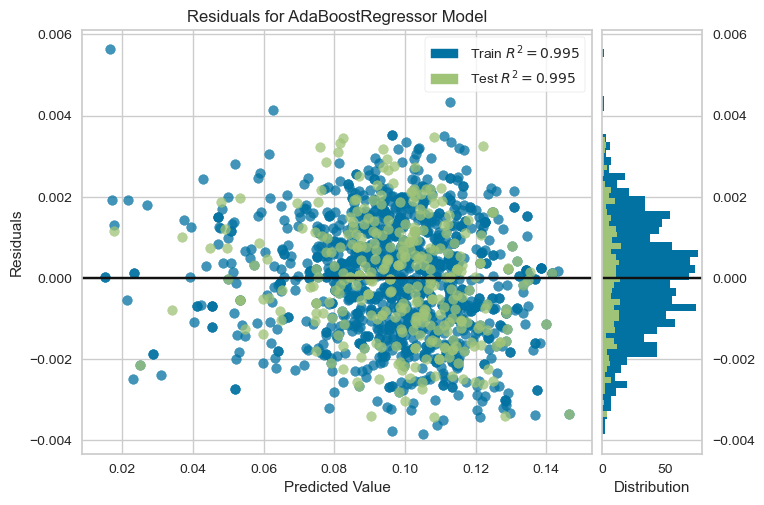

In [10]:
plot_model(final_model, plot='residuals')

* In general a plot showing no clear pattern and some center bunching suggests that the model's performance is relatively good at predicting the mean value of the target variable, but may struggle to predict values that deviate significantly from the mean. This can be seen with several data points far from mean.

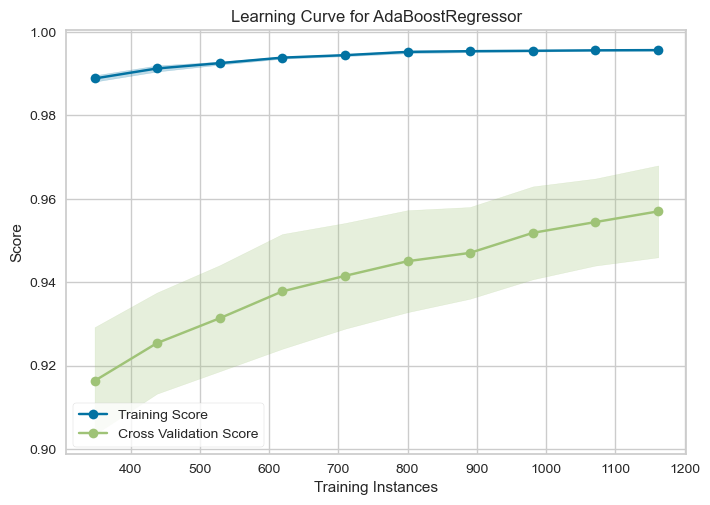

In [14]:
plot_model(boosted_model, plot='learning')

* The learning curve plot visualizes the performance of the algorithm as the training dataset increases.
<br>
* The training line has a slight rise and is above 0.98, indicating the model is able to learn from data well and can achieve a high training accuracy. 
<br>
* The CV line rises from ~ 0.91 to 0.96, which means that as more training data is used, the performance of the model on the cross-validation data improves. An increasing CV line indicates that the model is generalizing well and will likely perform well on new data.

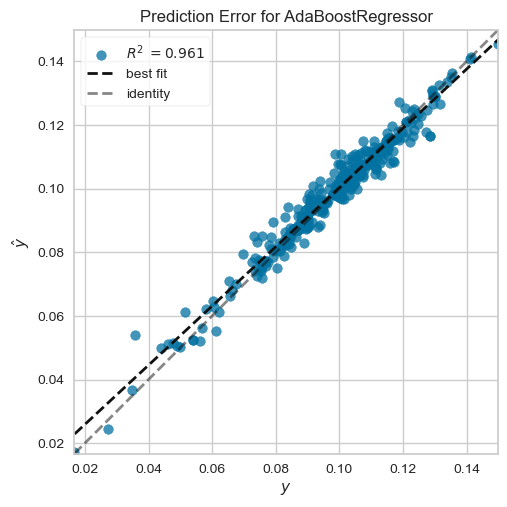

In [15]:
plot_model(boosted_model, plot='error')

* A prediction plot is used to analyze the output of a model. In molecular similarity prediction, the plot displays the actual versus predicted values of molecular similarity scores. The plot shows some bunching in the upper right portion, this indicates that the model is slighlty overestimating the molecular similarity scores.

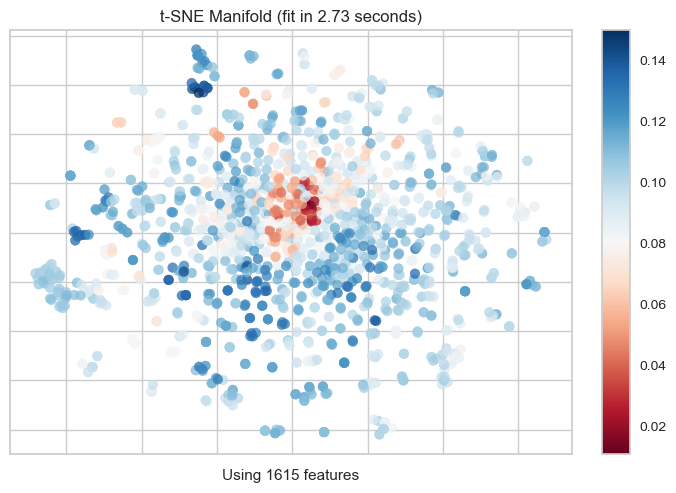

In [17]:
plot_model(boosted_model, plot='manifold')

* The manifold plot shows the relationship between the instances in the high-dimensional space and how they are projected onto the lower-dimensional space.
<br>
* Clusters or patterns in the plot can indicate the presence of groups or subgroups within the data that may not be apparent in the higher-dimensional space. The dark cluster in the center would make sense for the data, molecules with structural elements in common should show as clusters.

#### LightGBM (Light Gradient Boosting Machine)

* A open-source, gradient-boosting framework that uses a tree-based learning algorithm. It uses the leaf-wise growth strategy that selects the leaf with the maximum delta loss to grow, which helps it to achieve higher accuracy.
* Each tree is trained on the error residuals of the previous trees, applying an iterative gradient descent process that progressively improves the model accuracy.

#### An ensemble method

* A process of combining multiple models to improve the accuracy and robustness of the predictions. They help in reducing overfitting, increasing stability, and improving generalization performance.

##### Boosting
* Is a type of ensemble method in which multiple weak models are combined to form a strong model. At each iteration, a new weak model is trained to correct the errors made by the previous models.

#### AdaBoost (Adaptive Boosting)

* An ensemble method that combines multiple weak learners to create a stronger and more accurate predictor.
* Each weak learner is trained using only a subset of the training data, and the weights of the training examples are adjusted to give more emphasis to the examples that are harder to predict.
* The final prediction is a weighted sum of all the weak learner predictions, where the weight of each weak learner reflects their predictive power.

<br>

##### Ensembling LigthGBM and AdaBoost

* This would combine the strengths of both algorithms and potentially improve the performance and stability of the overall model.
* Using LightGBM as the base model and employing AdaBoost to improve the predictions of the weaker learners.
<br>

* LightGBM is a popular gradient boosting algorithm known for its speed and scalability, AdaBoost is an adaptive boosting algorithm known for its ability to handle noisy data and reduce bias and variance.



### Results

| Model     | Algorithm                          | MAE    | MSE    | RMSE   | R2     | RMSLE  | MAPE   | TT (Sec) |
| --------- | ---------------------------------- | ------ | ------ | ------ | ------ | ------ | ------ | -------- |
| lightgbm  | Light Gradient Boosting Machine    | 0.0032 | 0.0000 | 0.0044 | 0.9515 | 0.0041 | 0.0373 | 3.8900   |
| catboost  | CatBoost Regressor                  | 0.0033 | 0.0000 | 0.0045 | 0.9509 | 0.0041 | 0.0387 | 12.3030  |
| huber     | Huber Regressor                     | 0.0029 | 0.0000 | 0.0046 | 0.9481 | 0.0042 | 0.0377 | 4.4040   |
| xgboost   | Extreme Gradient Boosting           | 0.0032 | 0.0000 | 0.0048 | 0.9427 | 0.0044 | 0.0377 | 4.3310   |
| ridge     | Ridge Regression                    | 0.0031 | 0.0000 | 0.0049 | 0.9426 | 0.0044 | 0.0393 | 2.8270   |
| gbr       | Gradient Boosting Regressor         | 0.0044 | 0.0000 | 0.0056 | 0.9232 | 0.0051 | 0.0503 | 4.6110   |
| omp       | Orthogonal Matching Pursuit         | 0.0042 | 0.0000 | 0.0057 | 0.9227 | 0.0052 | 0.0525 | 2.8140   |
| rf        | Random Forest Regressor             | 0.0040 | 0.0000 | 0.0057 | 0.9198 | 0.0052 | 0.0481 | 3.6490   |
| br        | Bayesian Ridge                      | 0.0039 | 0.0000 | 0.0063 | 0.9017 | 0.0057 | 0.0460 | 4.3550   |
| et        | Extra Trees Regressor               | 0.0045 | 0.0001 | 0.0074 | 0.8631 | 0.0068 | 0.0548 | 3.6780   |
| dt        | Decision Tree Regressor             | 0.0047 | 0.0001 | 0.0078 | 0.8502 | 0.0071 | 0.0574 | 2.8390   |
| ada       | AdaBoost Regressor                  | 0.0069 | 0.0001 | 0.0084 | 0.8296 | 0.0076 | 0.0804 | 4.1990   |
| lar       | Least Angle Regression              | 0.0103 | 0.0003 | 0.0147 | 0.3068 | 0.0133 | 0.1172 | 3.3470   |
| knn       | K Neighbors Regressor               | 0.0130 | 0.0003 | 0.0177 | 0.2249 | 0.0163 | 0.1438 | 2.8300   |
| lasso     | Lasso Regression                    | 0.0154 | 0.0004 | 0.0204 | -0.0019| 0.0188 | 0.2132 | 2.7570   |
| en        | Elastic Net                         | 0.0154 | 0.0004 | 0.0204 | -0.0019| 0.0188 | 0.2132 | 2.7950   |
| llar      | Lasso Least Angle Regression        | 0.0154 | 0.0004 | 0.0204 | -0.0019| 0.0188 | 0.2132 | 2.7810   |
| dummy     | Dummy Regressor                     | 0.0154 | 0.0004 | 0.0204 | -0.0019| 0.0188 | 0.2132 | 2.7480   |
| par       | Passive Aggressive Regressor        | 0.0683 | 0.0049 | 0.0697 | -10.9370| 0.0653| 0.7056 | 2.7990   |
| lr        | Linear Regression                   | 0.1248 | 0.0751 | 0.2045 | -194.7046| 0.1253| 1.3797 | 4.1870   |

##### Ensemble Results

| Fold | MAE    | MSE    | RMSE   | R2     | RMSLE  | MAPE   |
| ---- | ------ | ------ | ------ | ------ | ------ | ------ |
| 0    | 0.0026 | 0.0000 | 0.0036 | 0.9663 | 0.0033 | 0.0298 |
| 1    | 0.0031 | 0.0000 | 0.0042 | 0.9713 | 0.0039 | 0.0509 |
| 2    | 0.0031 | 0.0000 | 0.0043 | 0.9588 | 0.0039 | 0.0354 |
| 3    | 0.0031 | 0.0000 | 0.0045 | 0.9421 | 0.0041 | 0.0344 |
| 4    | 0.0029 | 0.0000 | 0.0043 | 0.9531 | 0.0039 | 0.0304 |
| 5    | 0.0030 | 0.0000 | 0.0043 | 0.9637 | 0.0039 | 0.0330 |
| 6    | 0.0029 | 0.0000 | 0.0043 | 0.9456 | 0.0039 | 0.0325 |
| 7    | 0.0033 | 0.0000 | 0.0047 | 0.9409 | 0.0043 | 0.0364 |
| 8    | 0.0026 | 0.0000 | 0.0036 | 0.9624 | 0.0032 | 0.0284 |
| 9    | 0.0029 | 0.0000 | 0.0040 | 0.9645 | 0.0037 | 0.0325 |
| Mean | 0.0030 | 0.0000 | 0.0042 | 0.9569 | 0.0038 | 0.0344 |
| Std  | 0.0002 | 0.0000 | 0.0003 | 0.0102 | 0.0003 | 0.0060 |